<a href="https://colab.research.google.com/github/ZPavlo/ClusteringComparing/blob/main/MeanShift.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Prepare

In [1]:
%matplotlib inline
import sys
import os
from google.colab import drive
drive.mount('/content/gdrive')
ROOT_DATA = '/content/gdrive/MyDrive/datasets/clustering_data'
SAVE_FORLDER = "/content/gdrive/MyDrive/datasets/images"

if not os.path.isdir(SAVE_FORLDER):
    os.mkdir(SAVE_FORLDER)

Mounted at /content/gdrive


In [2]:
!git clone https://github.com/ZPavlo/ClusteringComparing.git
sys.path.insert(0, "/content/ClusteringComparing")

Cloning into 'ClusteringComparing'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 101 (delta 63), reused 57 (delta 25), pack-reused 0
Receiving objects: 100% (101/101), 1.83 MiB | 7.65 MiB/s, done.
Resolving deltas: 100% (63/63), done.


In [3]:
!cd ClusteringComparing && git pull

Already up to date.


In [4]:
!pip install sklearn_extras
!pip install scikit-learn-extra
!pip install scikit-learn

  Created wheel for sklearn-extras: filename=sklearn_extras-0.1.1-cp37-none-any.whl size=2206 sha256=62f9494542e25f1a3e5997be8f523069777c4dab1005db863021cfb0609ec9bc
  Stored in directory: /root/.cache/pip/wheels/40/95/76/5c740a32631c60dd991fef0730234cd215f39acb898862a502
Successfully built sklearn-extras
     |████████████████████████████████| 1.7MB 13.6MB/s 
     |████████████████████████████████| 22.3MB 1.5MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

sns.set()

## Datasets

In [6]:
from tools import make_plot

### Gaussian blobs

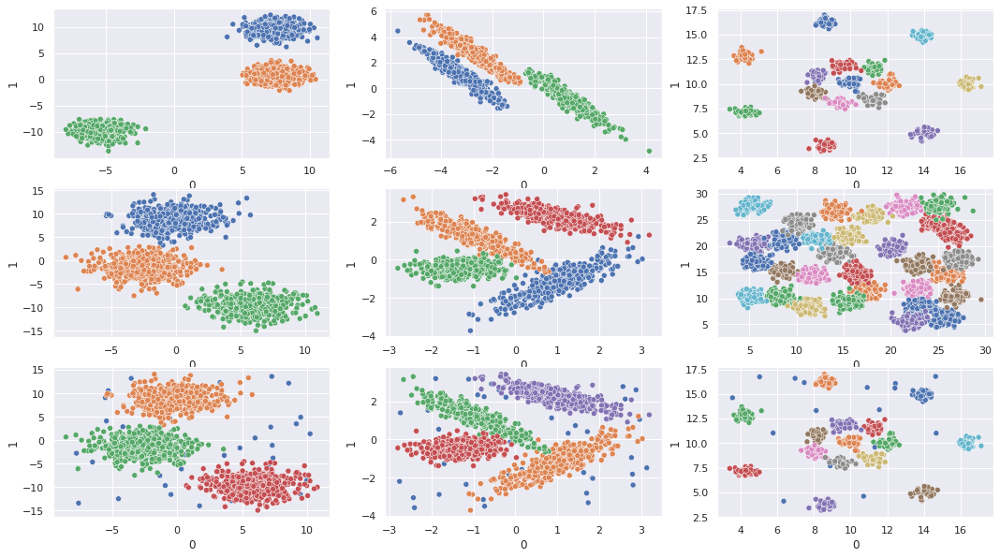

In [7]:
from datasets import get_data_blobs, get_data_blobs2, get_data_blobs3, \
                     get_data_blobs4, get_data_R15, get_data_d31, get_gaussian_data_3d, \
                     get_data_blobs2_noise, get_data_blobs4_noise, get_data_R15_noise, \
                     GAUSSIAN_BLOBS_DATA, GAUSSIAN_BLOBS_K 

fig, axes = plt.subplots(3, 3, figsize=(18, 10))

make_plot(*get_data_blobs(), axes=axes[0, 0])
make_plot(*get_data_blobs3(), axes=axes[0, 1])
make_plot(*get_data_R15(path=ROOT_DATA), axes=axes[0, 2])

make_plot(*get_data_blobs2(), axes=axes[1, 0])
make_plot(*get_data_blobs4(), axes=axes[1, 1])
make_plot(*get_data_d31(path=ROOT_DATA), axes=axes[1, 2])

make_plot(*get_data_blobs2_noise(), axes=axes[2, 0])
make_plot(*get_data_blobs4_noise(), axes=axes[2, 1])
make_plot(*get_data_R15_noise(path=ROOT_DATA), axes=axes[2, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian.png"))
plt.show()

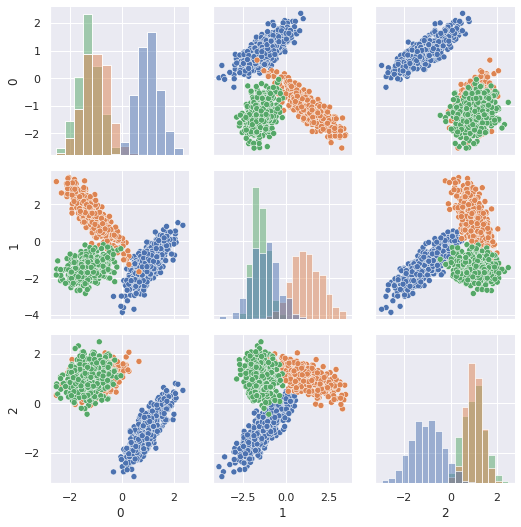

In [8]:
from tools import make_3d_plot

X, y = get_gaussian_data_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "gaussian3d.png"))
plt.show()

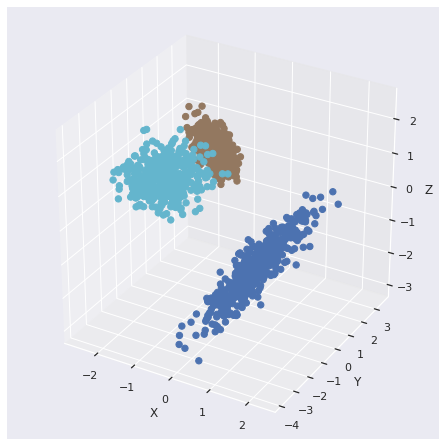

In [9]:
from tools import make_3d_plot

make_3d_plot(X, y)

### Unbalance Gaussian

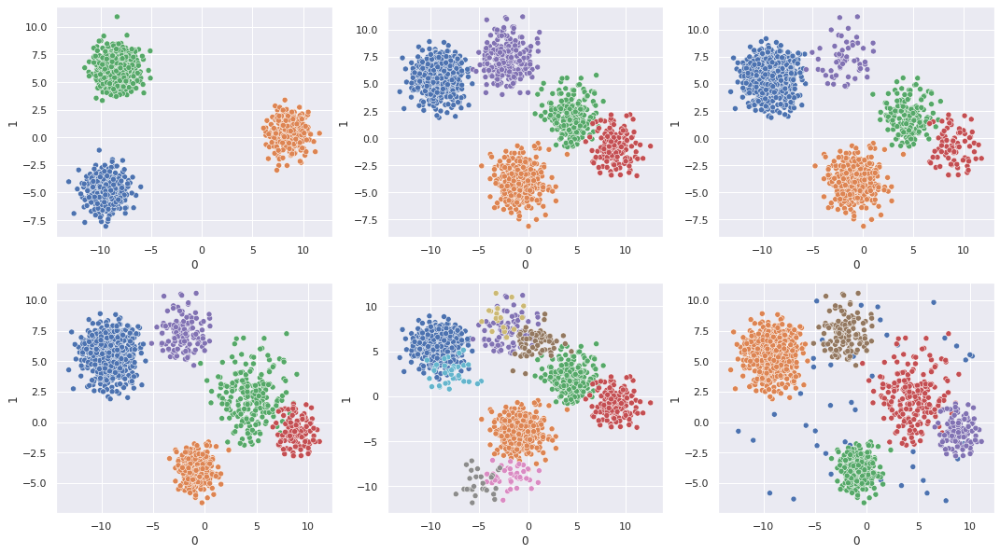

In [10]:
from datasets import get_data_unbalance1, get_data_unbalance2, get_data_unbalance3, \
                     get_data_unbalance4, get_data_unbalance5, get_data_unbalance6, \
                     UNBALANCED_GAUSSIAN_BLOBS_DATA, UNBALANCED_GAUSSIAN_BLOBS_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_unbalance1(), axes=axes[0, 0])
make_plot(*get_data_unbalance2(), axes=axes[0, 1])
make_plot(*get_data_unbalance3(), axes=axes[0, 2])
make_plot(*get_data_unbalance4(), axes=axes[1, 0])
make_plot(*get_data_unbalance5(), axes=axes[1, 1])
make_plot(*get_data_unbalance6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "unbalance gaussian.png"))
plt.show()

### Cube 

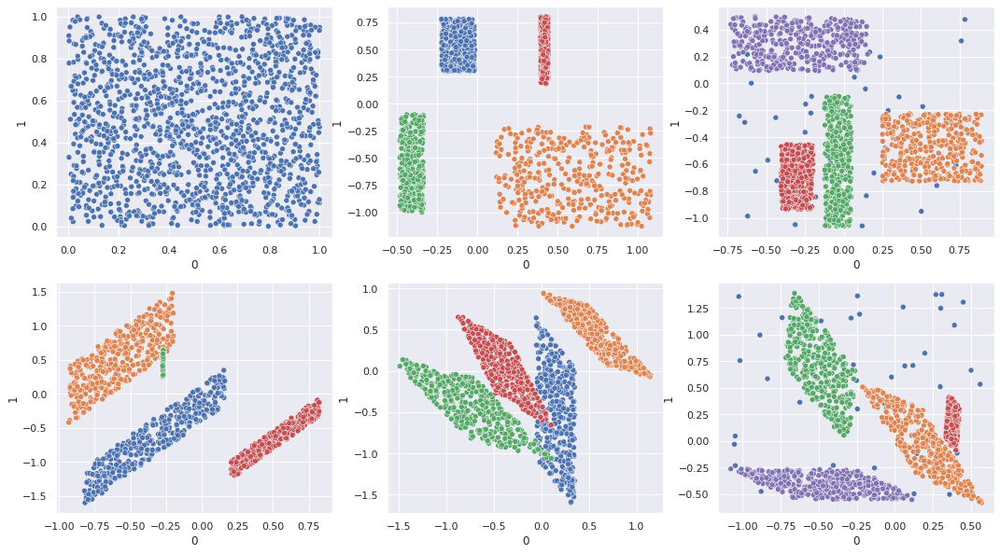

In [11]:
from datasets import get_data_cube, get_data_cube2, get_data_cube3, \
                     get_data_cube4, get_data_cube5, get_data_cube6, \
                     get_data_cube_3d, CUBES_RECT_PARALLEL_DATA, CUBES_RECT_PARALLEL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_cube(), axes=axes[0, 0])
make_plot(*get_data_cube2(), axes=axes[0, 1])
make_plot(*get_data_cube3(), axes=axes[1, 0])
make_plot(*get_data_cube4(), axes=axes[1, 1])
make_plot(*get_data_cube5(), axes=axes[0, 2])
make_plot(*get_data_cube6(), axes=axes[1, 2])

plt.savefig(os.path.join(SAVE_FORLDER, "cube.png"))
plt.show()

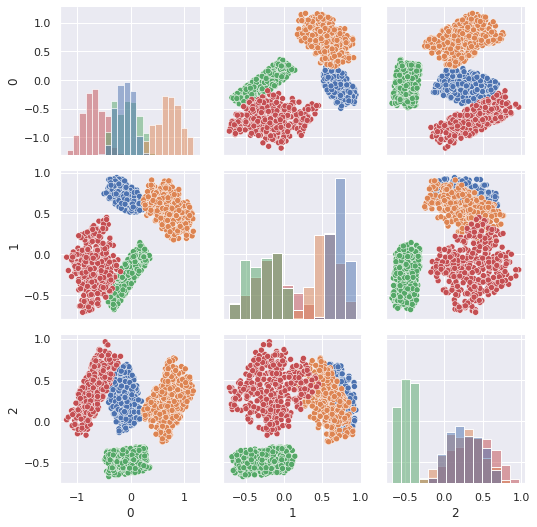

In [12]:
X, y = get_data_cube_3d()

df = pd.DataFrame(data=X)
df["cluster"] = y

g = sns.PairGrid(df, hue="cluster", palette="deep")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

plt.savefig(os.path.join(SAVE_FORLDER, "cube3d.png"))
plt.show()

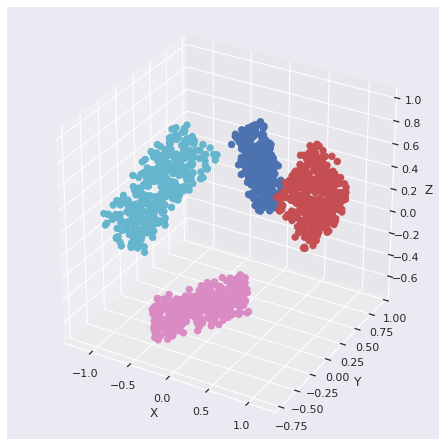

In [13]:
make_3d_plot(X, y)

### Non-spherical

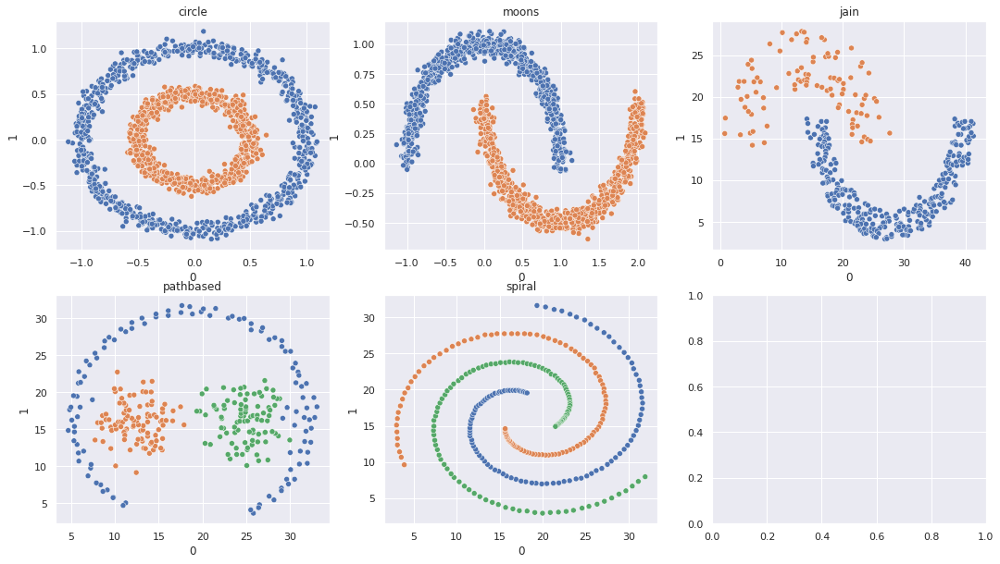

In [14]:
from datasets import get_data_circle, get_data_moons, get_data_jain, \
                     get_data_pathbased, get_data_spiral, NON_SPHERICAL_DATA, \
                     NON_SPHERICAL_K

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

make_plot(*get_data_circle(), axes=axes[0, 0], title="circle")
make_plot(*get_data_moons(), axes=axes[0, 1], title="moons")
make_plot(*get_data_jain(path=ROOT_DATA), axes=axes[0, 2], title="jain")
make_plot(*get_data_pathbased(path=ROOT_DATA), axes=axes[1, 0], title="pathbased")
make_plot(*get_data_spiral(path=ROOT_DATA), axes=axes[1, 1], title="spiral")

plt.savefig(os.path.join(SAVE_FORLDER, "non-spherical.png"))
plt.show()

### Combining forms

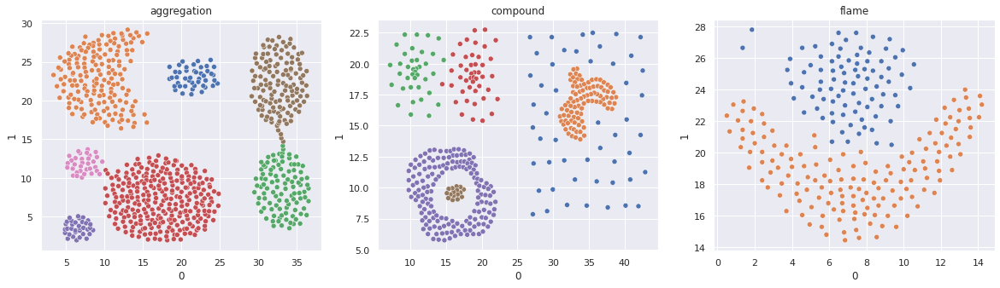

In [15]:
from datasets import get_data_aggregation, get_data_compound, get_data_flame, \
                     get_data_cube, OTHER_FORMS_DATA, OTHER_FORMS_K



fig, axes = plt.subplots(1, 3, figsize=(20, 5))

make_plot(*get_data_aggregation(path=ROOT_DATA), axes=axes[0], title="aggregation")
make_plot(*get_data_compound(path=ROOT_DATA), axes=axes[1], title="compound")
make_plot(*get_data_flame(path=ROOT_DATA), axes=axes[2], title="flame")

plt.savefig(os.path.join(SAVE_FORLDER, "combining forms.png"))
plt.show()

## Data clustering

In [16]:
import numpy as np

from meanshift_utils import run_MeanShift_on_data_with_K, run_MeanShift_on_data, run_on_3d_data

In [17]:
import os

if not os.path.exists(os.path.join(ROOT_DATA, "images")):
    os.mkdir(os.path.join(ROOT_DATA, "images"))

### Gaussian blobs

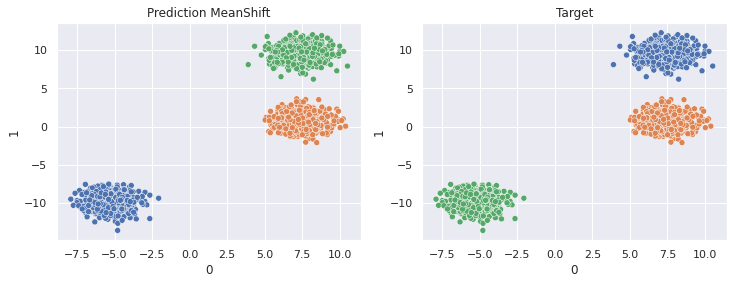

[MeanShift]: accuracy 1.0000, time 6.625, mem 0.853Mb


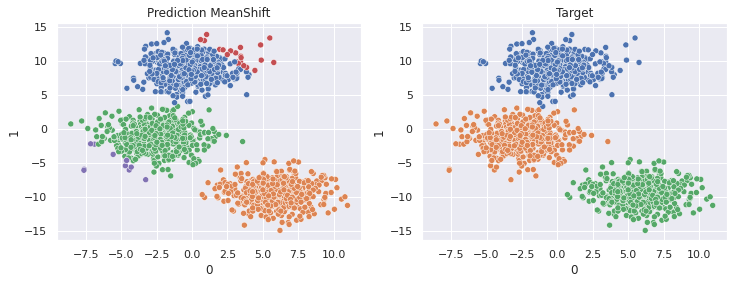

[MeanShift]: accuracy 0.9854, time 10.899, mem 0.855Mb


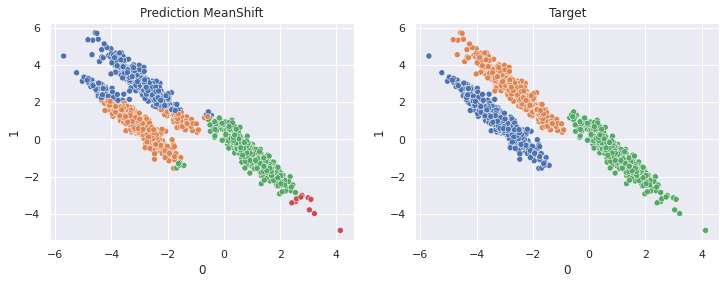

[MeanShift]: accuracy 0.8893, time 12.186, mem 0.994Mb


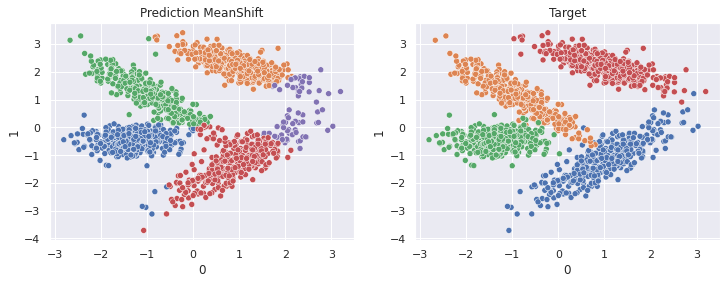

[MeanShift]: accuracy 0.9536, time 7.109, mem 0.898Mb


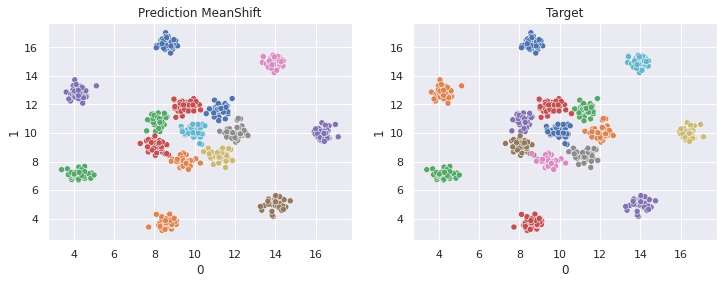

[MeanShift]: accuracy 0.9991, time 1.130, mem 0.286Mb


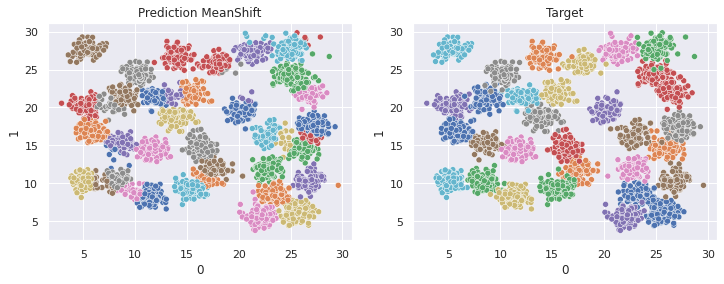

[MeanShift]: accuracy 0.9931, time 15.265, mem 1.786Mb


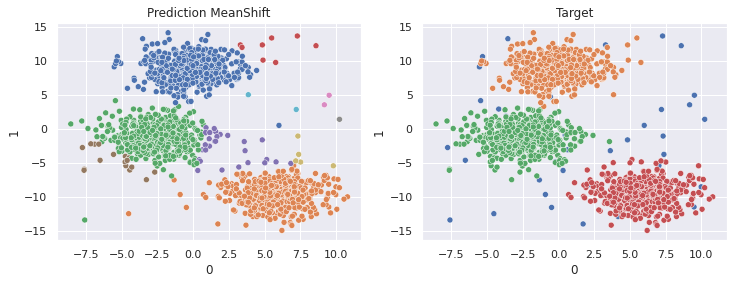

[MeanShift]: accuracy 0.9674, time 12.502, mem 0.862Mb


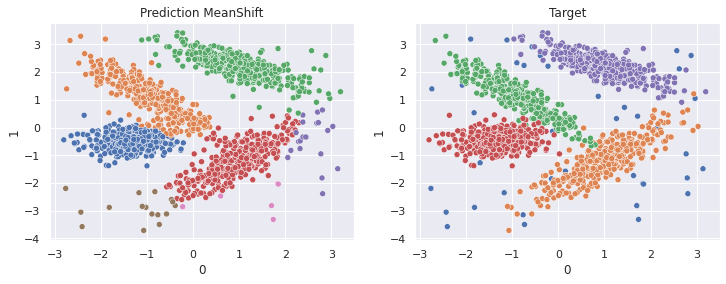

[MeanShift]: accuracy 0.9582, time 7.938, mem 0.902Mb


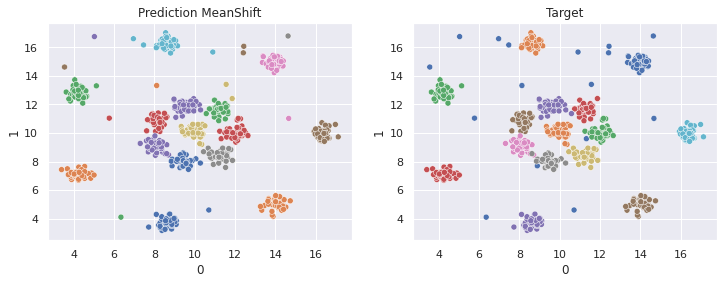

[MeanShift]: accuracy 0.9969, time 1.229, mem 0.256Mb


In [18]:
list_of_bandwidth = [2.0, 2.0, 1.1, 
                     1.1, 1.0, 1.0, 
                     2.0, 1.0, 1.0]
run_MeanShift_on_data_with_K(GAUSSIAN_BLOBS_DATA, list_of_bandwidth, "GAUSSIAN_BLOBS", path=ROOT_DATA)

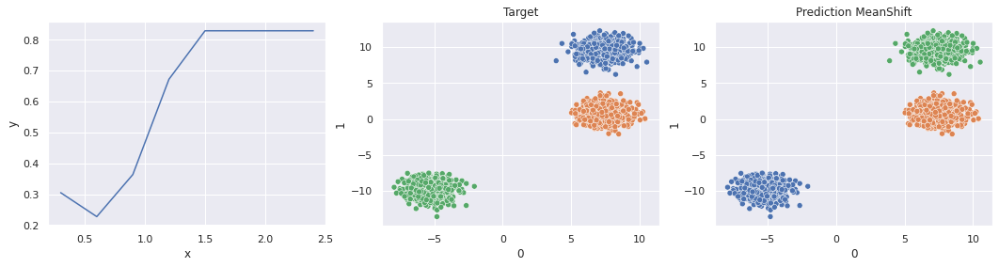

Best bandwidth = 1.5
[MeanShift]: accuracy 1.0000


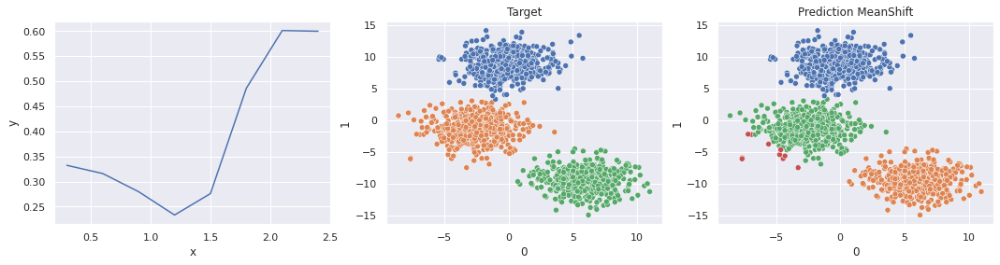

Best bandwidth = 2.1
[MeanShift]: accuracy 0.9943


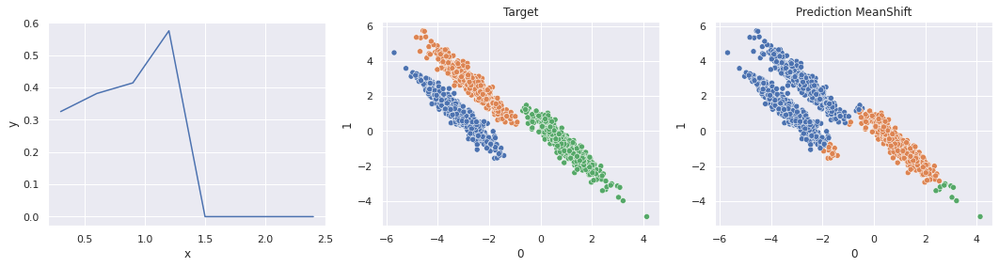

Best bandwidth = 1.2
[MeanShift]: accuracy 0.7591


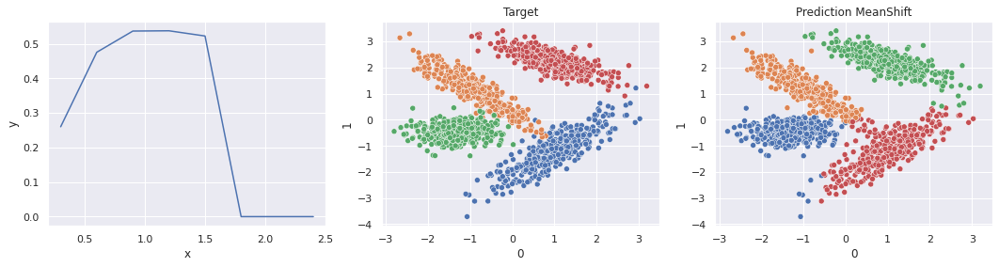

Best bandwidth = 1.2
[MeanShift]: accuracy 0.9773


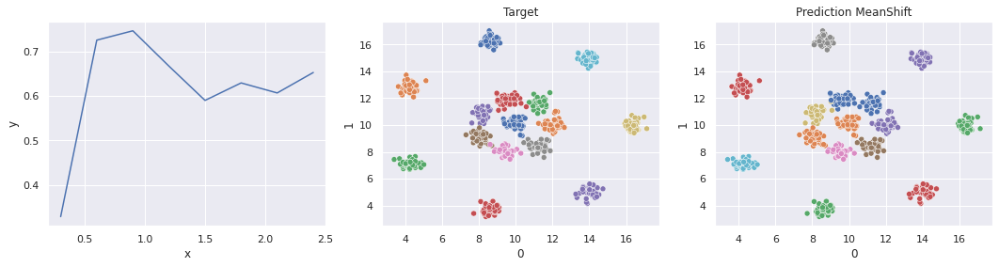

Best bandwidth = 0.9
[MeanShift]: accuracy 0.9983


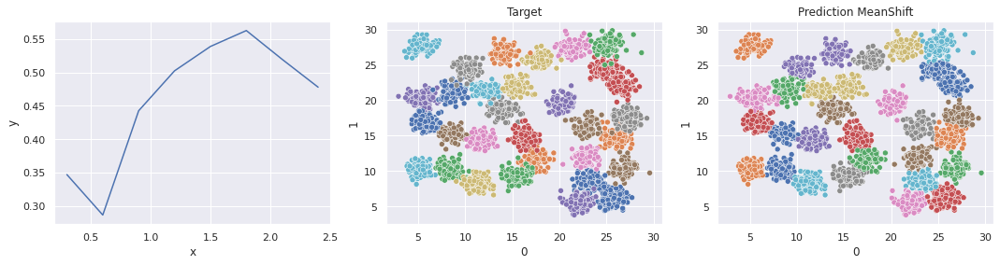

Best bandwidth = 1.8
[MeanShift]: accuracy 0.9940


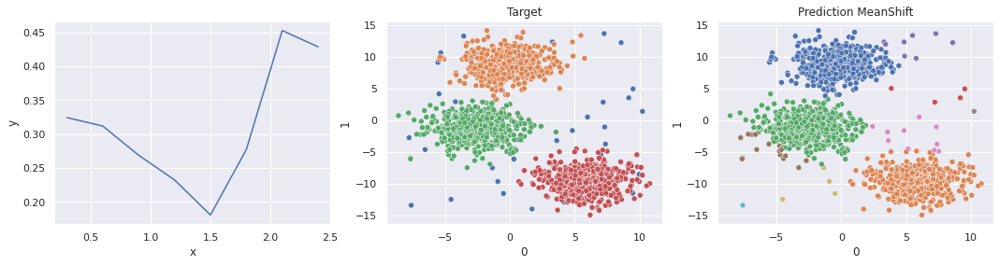

Best bandwidth = 2.1
[MeanShift]: accuracy 0.9764


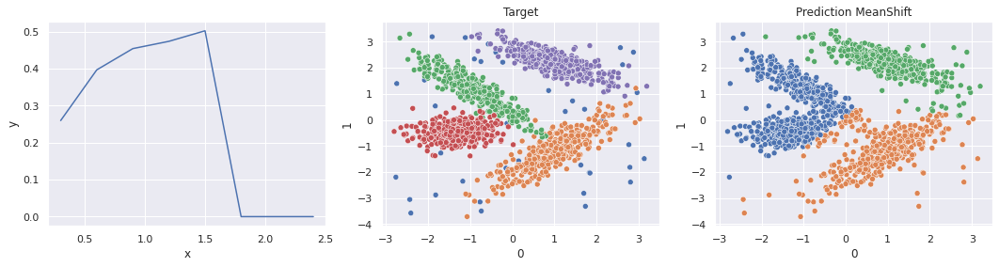

Best bandwidth = 1.5
[MeanShift]: accuracy 0.8436


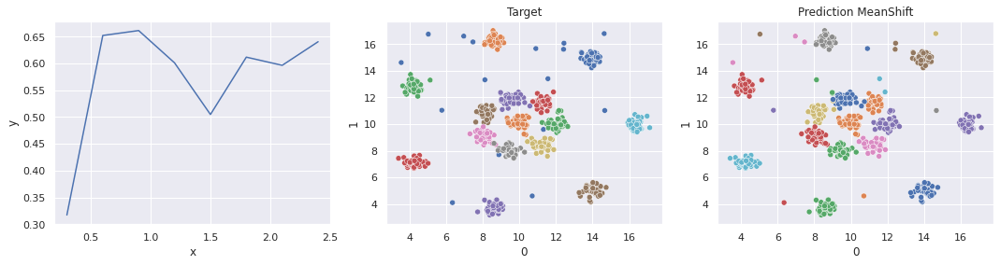

Best bandwidth = 0.9
[MeanShift]: accuracy 0.9962


In [19]:
run_MeanShift_on_data(GAUSSIAN_BLOBS_DATA, [0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4], "GAUSSIAN_BLOBS", path=ROOT_DATA)

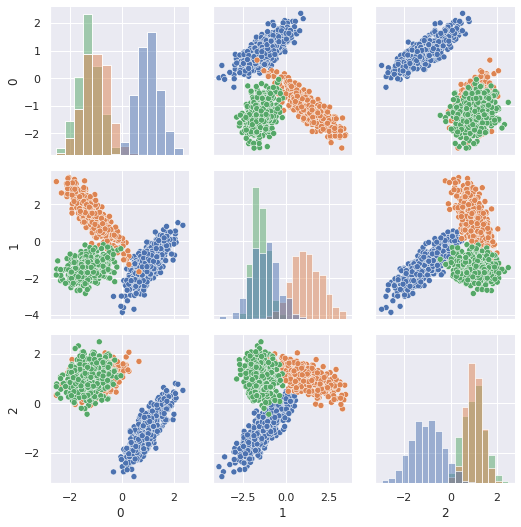

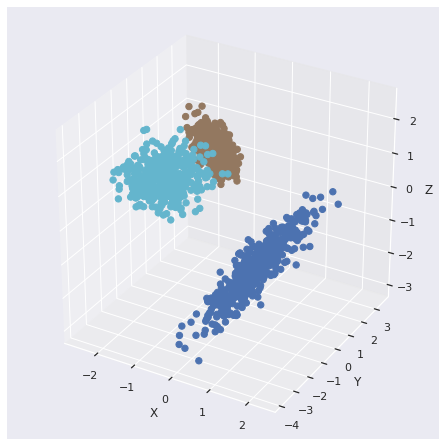

[MeanShift]: accuracy 0.9825, time 10.031, mem 0.902Mb


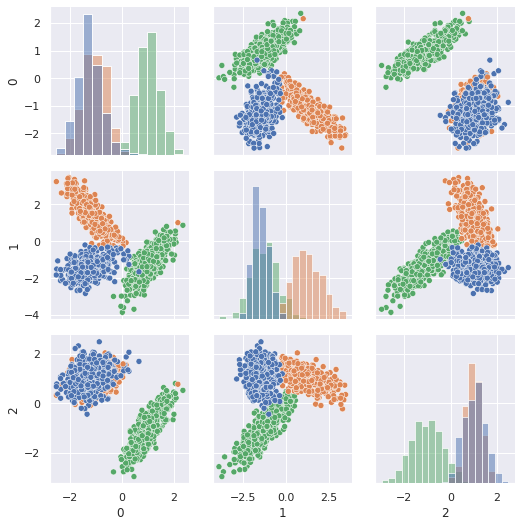

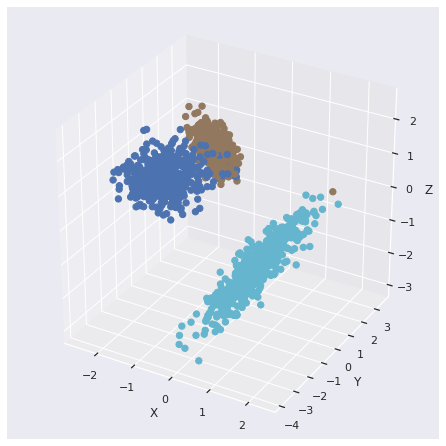

In [20]:
X, y = get_gaussian_data_3d()

run_on_3d_data(X, y, bandwidth=1.0, data_name="GAUSSIAN_BLOBS", path=ROOT_DATA)

### Unbalance Gaussian

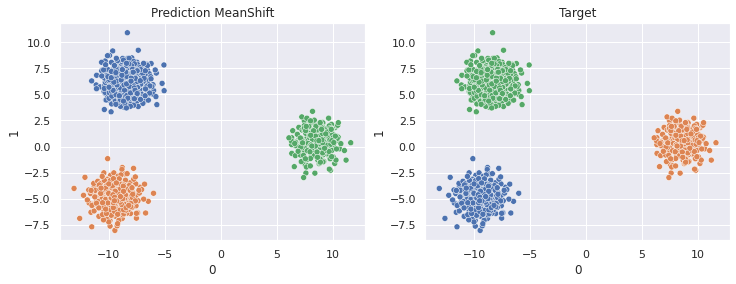

[MeanShift]: accuracy 1.0000, time 6.000, mem 0.990Mb


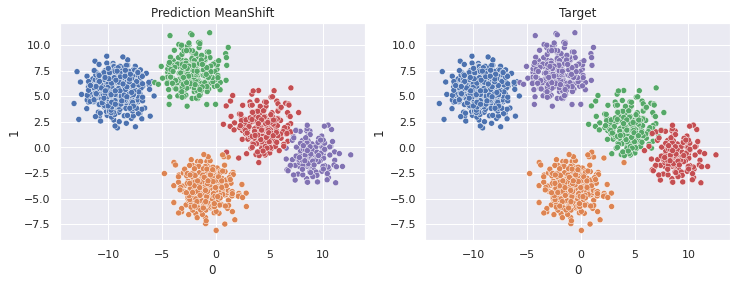

[MeanShift]: accuracy 0.9960, time 6.963, mem 0.908Mb


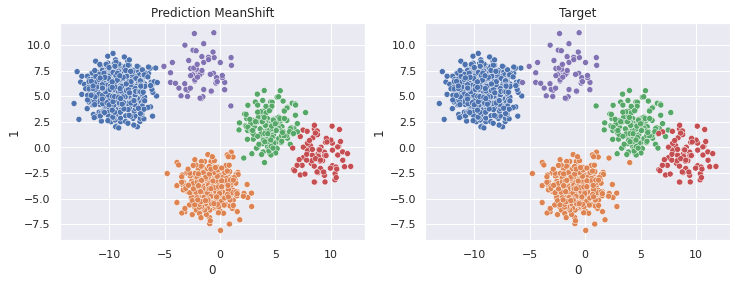

[MeanShift]: accuracy 0.9968, time 6.634, mem 0.834Mb


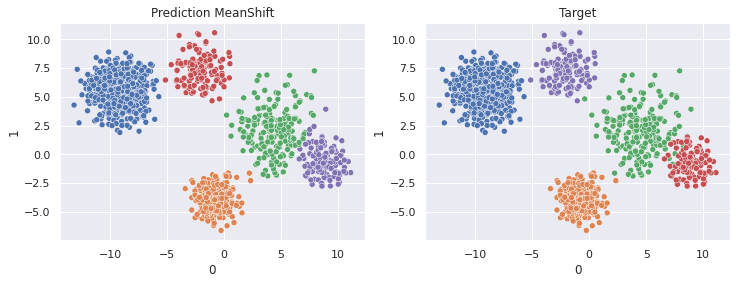

[MeanShift]: accuracy 0.9960, time 5.883, mem 0.903Mb


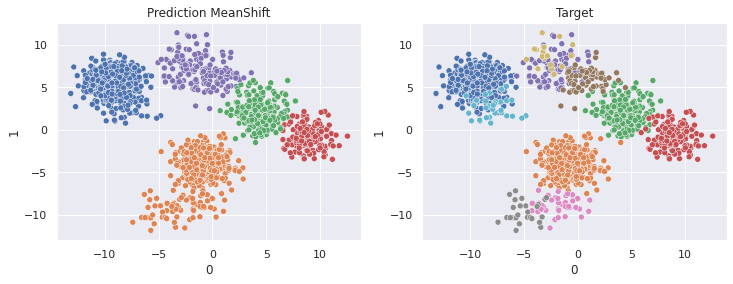

[MeanShift]: accuracy 0.9510, time 6.885, mem 0.908Mb


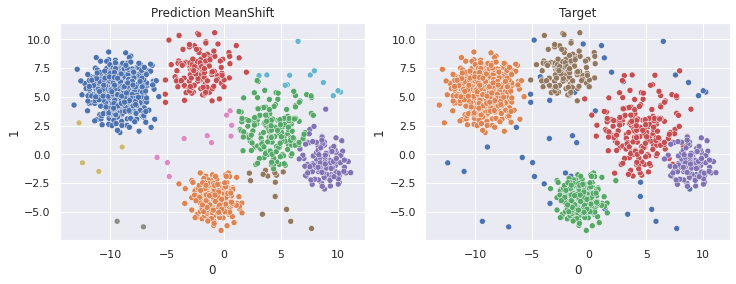

[MeanShift]: accuracy 0.9885, time 5.357, mem 0.816Mb


In [21]:
list_of_bandwidth = [2.0, 2.2, 2.4, 2.4, 2.5, 2.5]

run_MeanShift_on_data_with_K(UNBALANCED_GAUSSIAN_BLOBS_DATA, list_of_bandwidth, "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

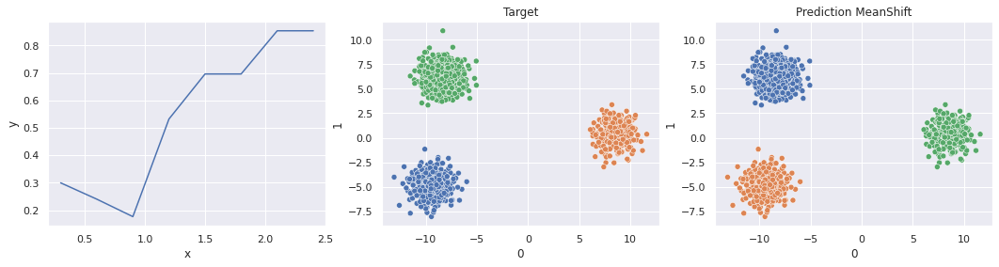

Best bandwidth = 2.1
[MeanShift]: accuracy 1.0000


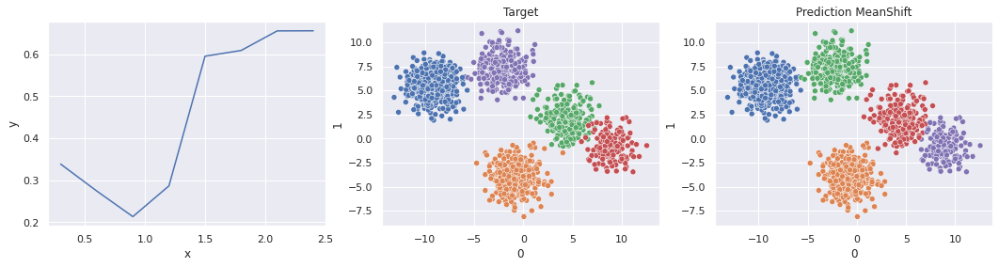

Best bandwidth = 2.4
[MeanShift]: accuracy 0.9965


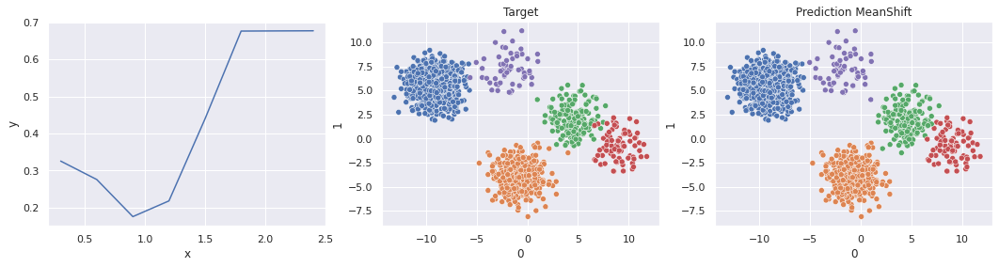

Best bandwidth = 2.4
[MeanShift]: accuracy 0.9968


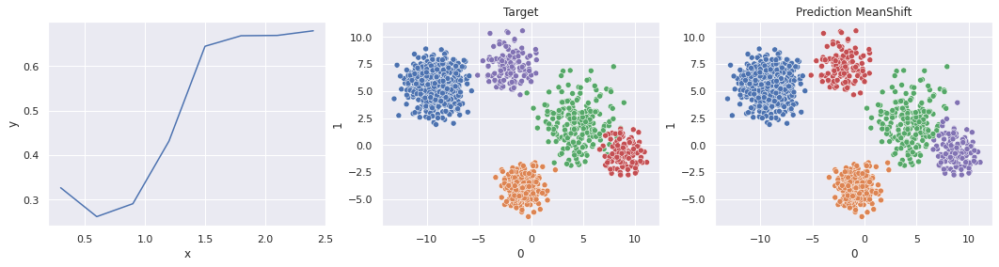

Best bandwidth = 2.4
[MeanShift]: accuracy 0.9960


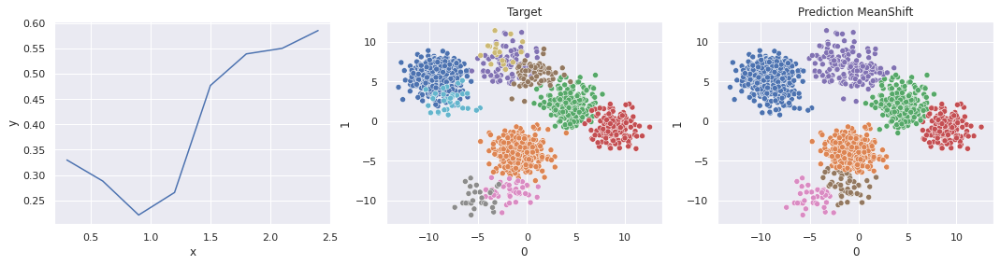

Best bandwidth = 2.4
[MeanShift]: accuracy 0.9668


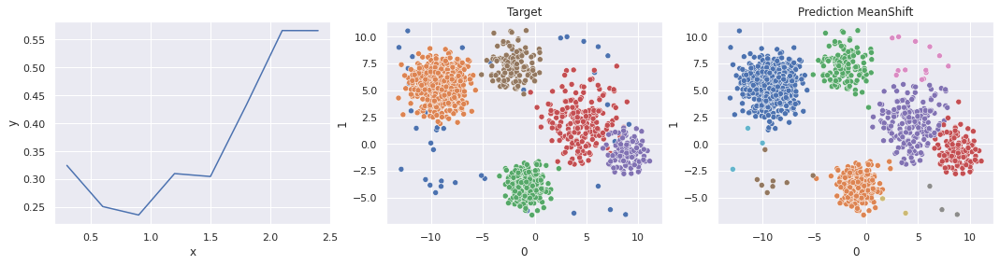

Best bandwidth = 2.1
[MeanShift]: accuracy 0.9837


In [22]:
run_MeanShift_on_data(UNBALANCED_GAUSSIAN_BLOBS_DATA, [0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4], "UNBALANCED_GAUSSIAN_BLOBS", path=ROOT_DATA)

### Cube

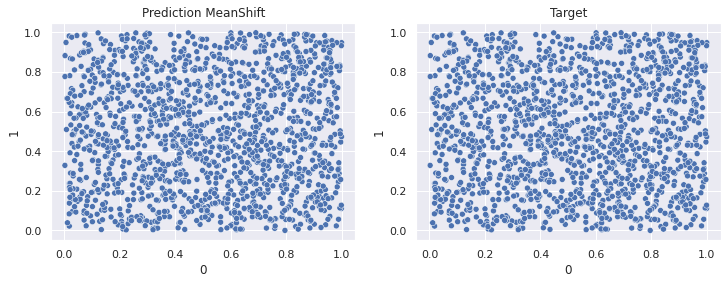

[MeanShift]: accuracy 1.0000, time 2.528, mem 0.879Mb


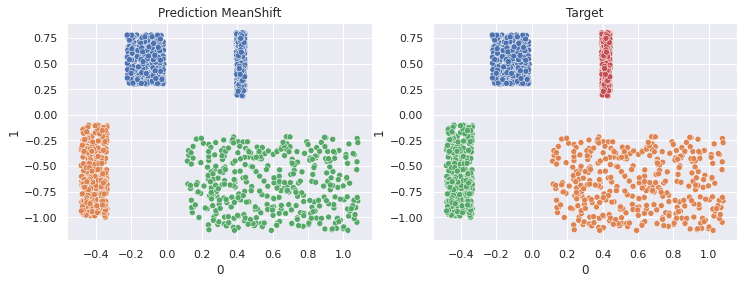

[MeanShift]: accuracy 0.8749, time 4.715, mem 1.000Mb


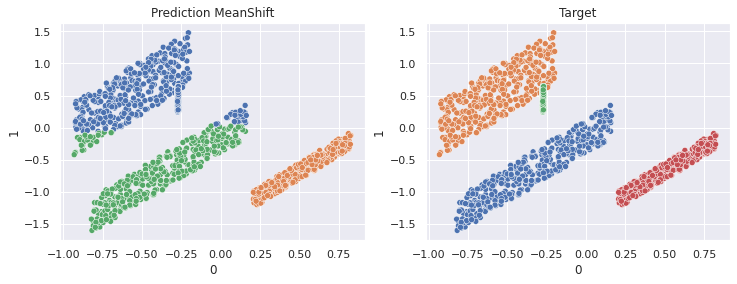

[MeanShift]: accuracy 0.8372, time 7.207, mem 0.862Mb


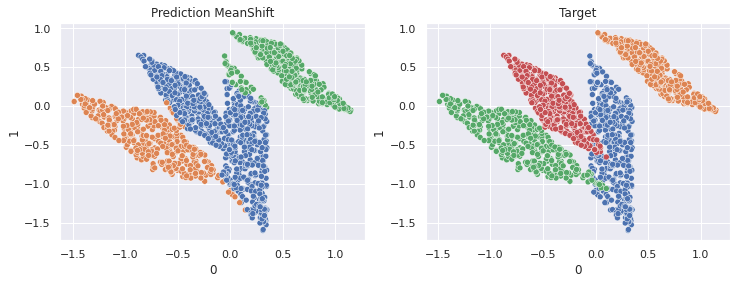

[MeanShift]: accuracy 0.8444, time 16.664, mem 1.026Mb


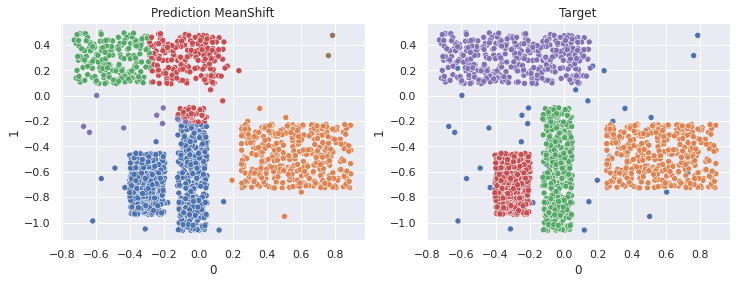

[MeanShift]: accuracy 0.8332, time 11.137, mem 0.853Mb


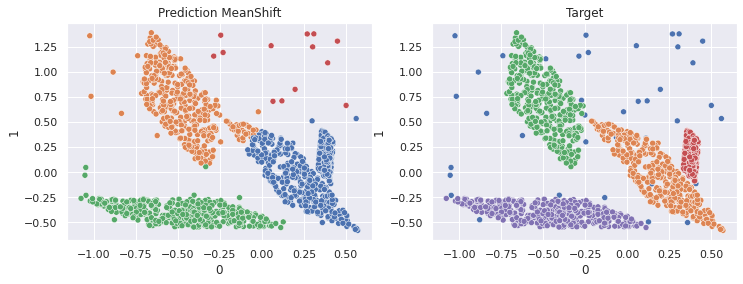

[MeanShift]: accuracy 0.8593, time 7.312, mem 0.986Mb


In [23]:
list_of_bandwidth = [1.0, 0.5, 0.5, 0.4, 0.27, 0.5]

run_MeanShift_on_data_with_K(CUBES_RECT_PARALLEL_DATA, list_of_bandwidth, "CUBES_RECT_PARALLEL", path=ROOT_DATA)

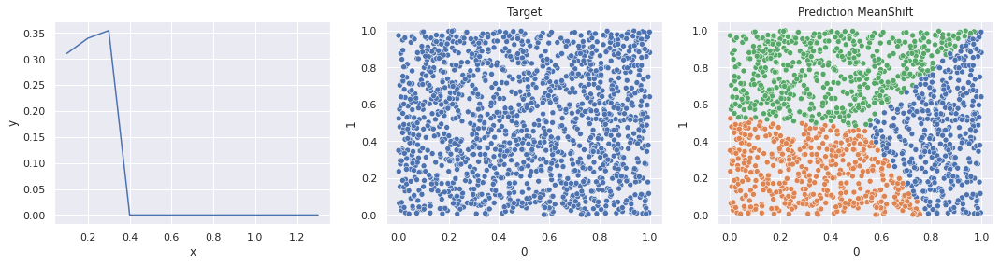

Best bandwidth = 0.30000000000000004
[MeanShift]: accuracy 0.3363


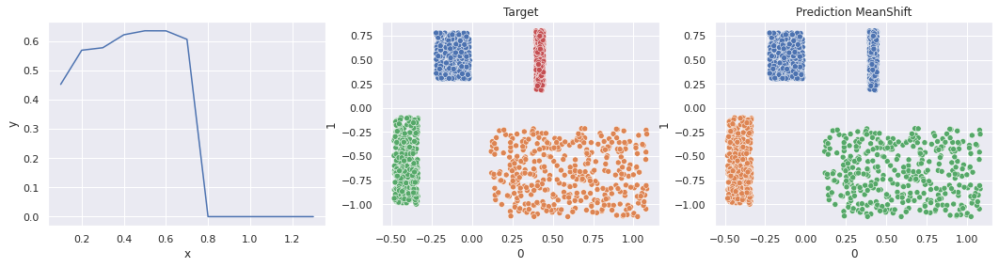

Best bandwidth = 0.5
[MeanShift]: accuracy 0.8749


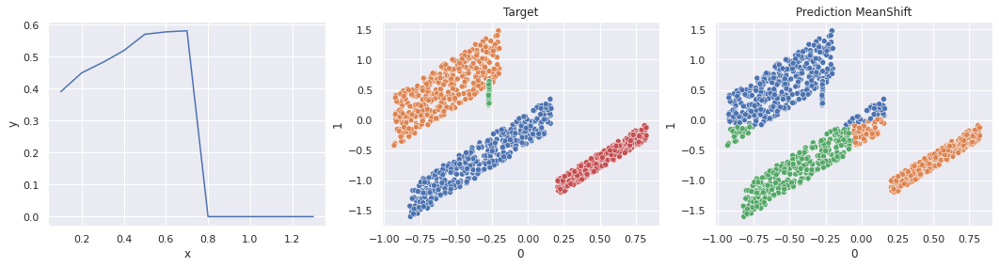

Best bandwidth = 0.7000000000000001
[MeanShift]: accuracy 0.8001


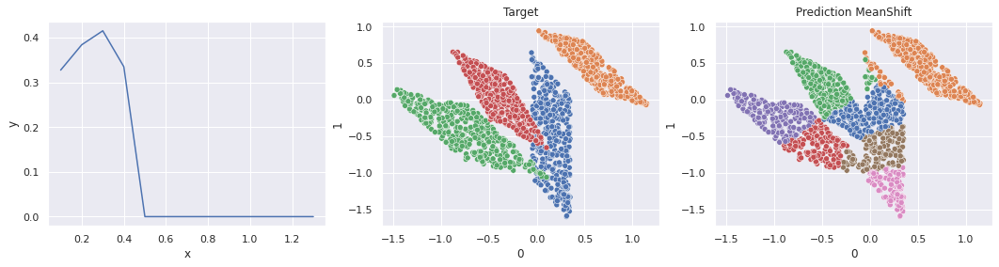

Best bandwidth = 0.30000000000000004
[MeanShift]: accuracy 0.8570


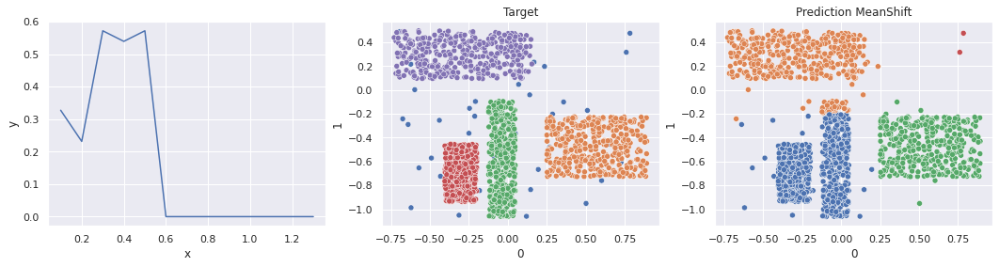

Best bandwidth = 0.5
[MeanShift]: accuracy 0.8515


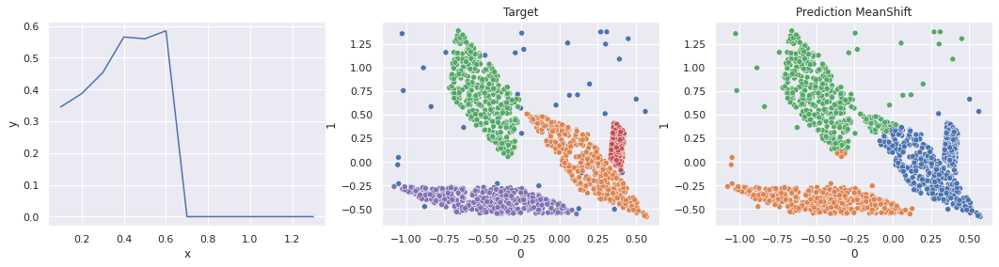

Best bandwidth = 0.6
[MeanShift]: accuracy 0.8493


In [24]:
BandWidth_range = list(np.arange(0.1, 1.4, 0.1))

run_MeanShift_on_data(CUBES_RECT_PARALLEL_DATA, BandWidth_range, "CUBES_RECT_PARALLEL", path=ROOT_DATA)

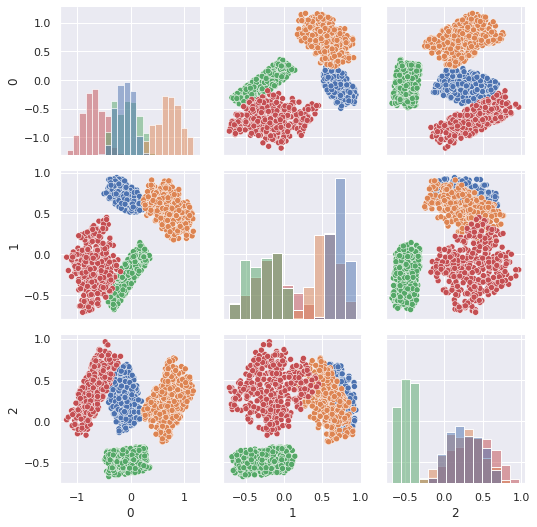

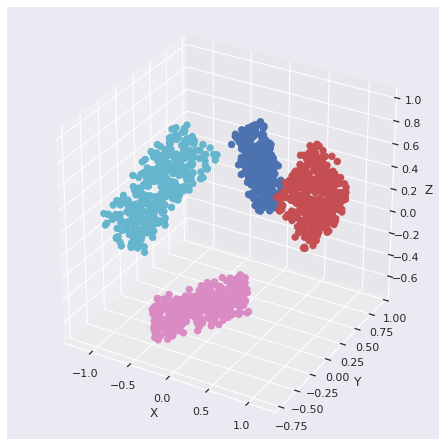

[MeanShift]: accuracy 0.9848, time 11.656, mem 0.522Mb


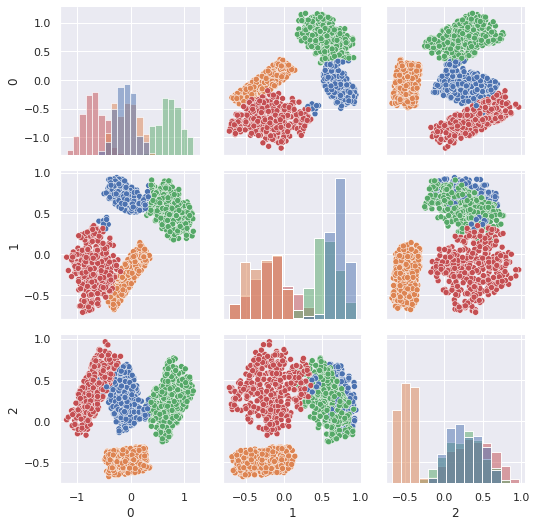

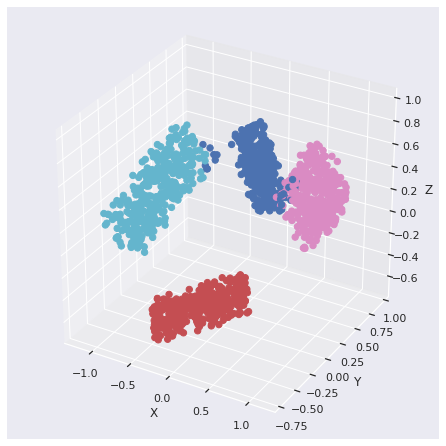

In [25]:
X, y = get_data_cube_3d()
run_on_3d_data(X, y, bandwidth=0.4, data_name="CUBES_RECT_PARALLEL", path=ROOT_DATA)

### Non-spherical

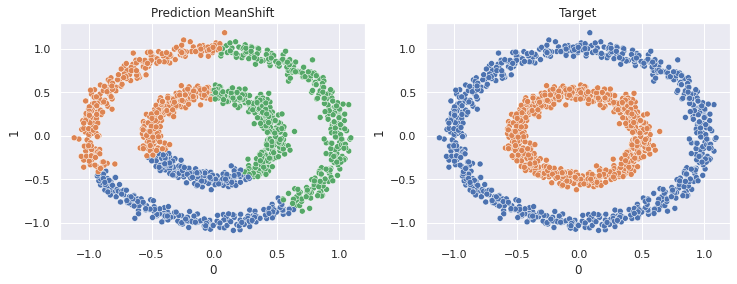

[MeanShift]: accuracy 0.5000, time 14.576, mem 1.005Mb


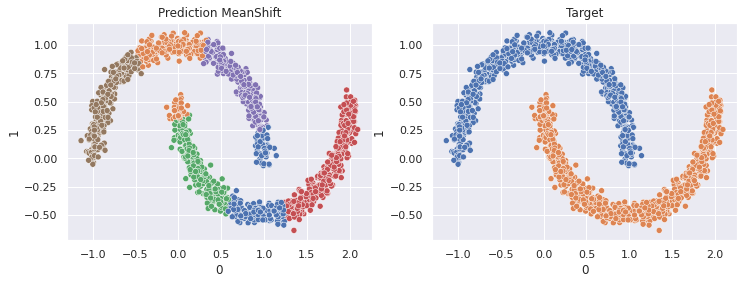

[MeanShift]: accuracy 0.6379, time 8.505, mem 0.854Mb


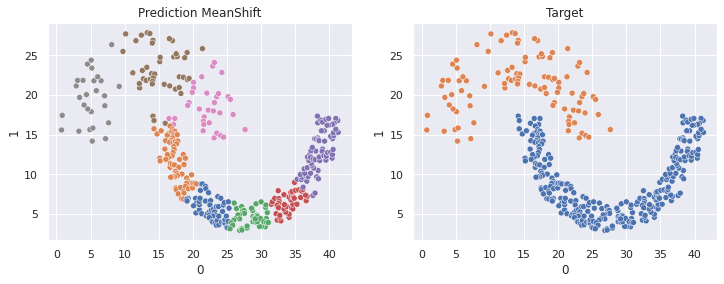

[MeanShift]: accuracy 0.5130, time 1.549, mem 0.282Mb


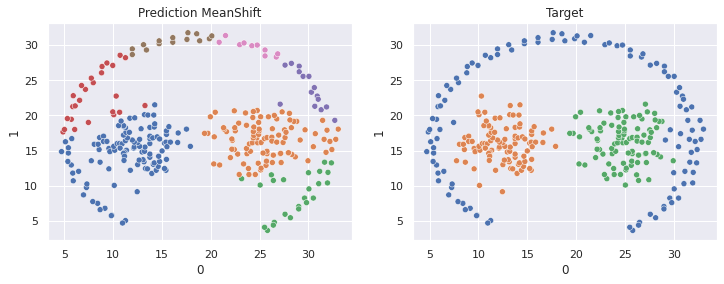

[MeanShift]: accuracy 0.7926, time 1.175, mem 0.168Mb


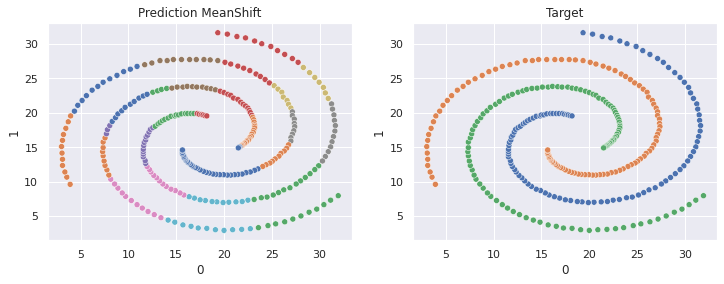

[MeanShift]: accuracy 0.6806, time 1.842, mem 0.310Mb


In [26]:
list_of_bandwidth = [0.5, 0.5, 5.0, 5.0, 5.0]

run_MeanShift_on_data_with_K(NON_SPHERICAL_DATA, list_of_bandwidth, "NON_SPHERICAL", path=ROOT_DATA)

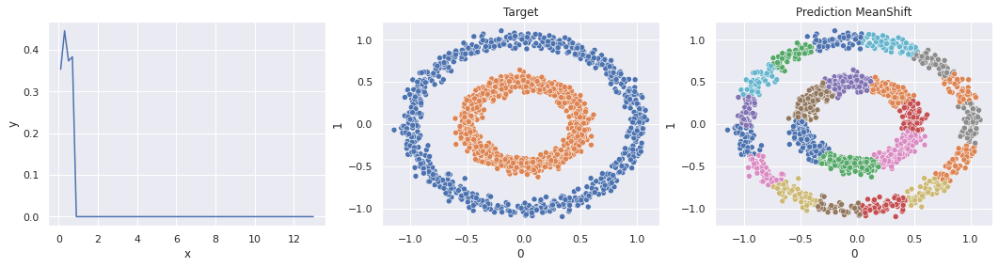

Best bandwidth = 0.30000000000000004
[MeanShift]: accuracy 0.5531


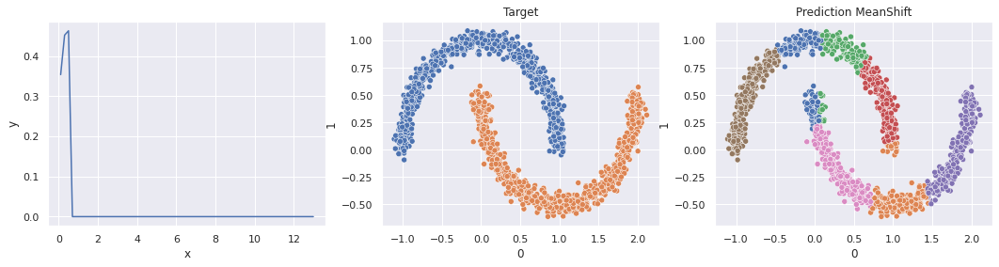

Best bandwidth = 0.5000000000000001
[MeanShift]: accuracy 0.6266


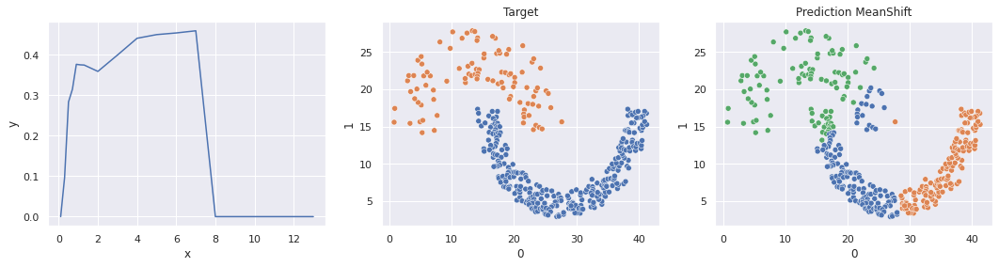

Best bandwidth = 7
[MeanShift]: accuracy 0.6047


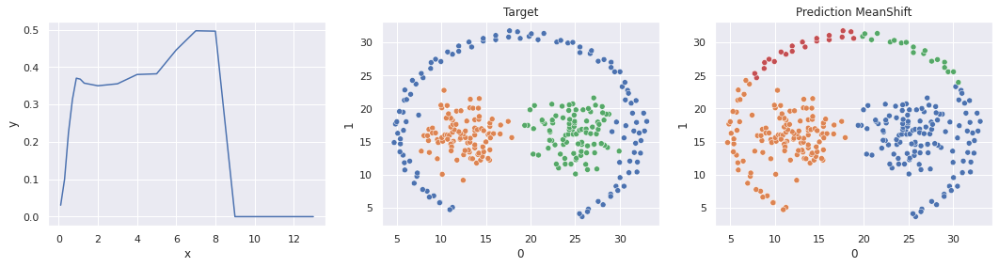

Best bandwidth = 7
[MeanShift]: accuracy 0.7517


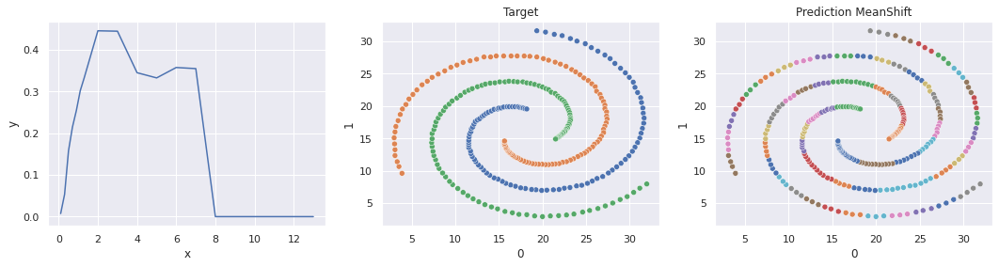

Best bandwidth = 2
[MeanShift]: accuracy 0.6862


In [27]:
BandWidth_range = list(np.arange(0.1, 1.4, 0.2)) + list(np.arange(2, 14, 1))

run_MeanShift_on_data(NON_SPHERICAL_DATA, BandWidth_range, "NON_SPHERICAL", path=ROOT_DATA)

### Combining forms

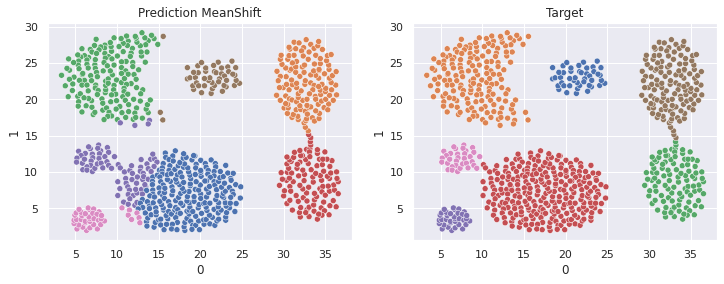

[MeanShift]: accuracy 0.9503, time 4.210, mem 0.551Mb


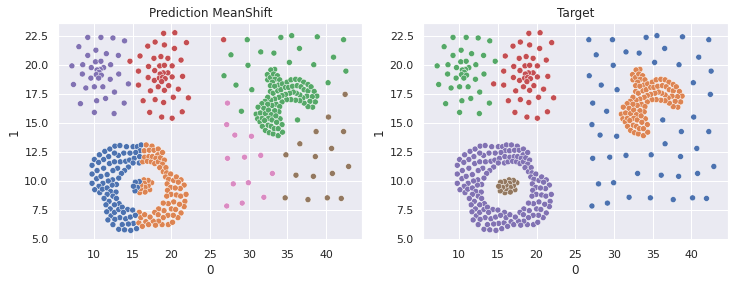

[MeanShift]: accuracy 0.8694, time 1.772, mem 0.334Mb


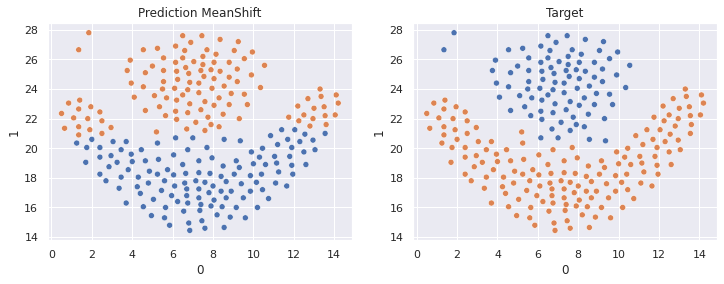

[MeanShift]: accuracy 0.7439, time 1.307, mem 0.164Mb


In [28]:
list_of_bandwidth = [4, 4, 4]

run_MeanShift_on_data_with_K(OTHER_FORMS_DATA, list_of_bandwidth, "OTHER_FORMS", path=ROOT_DATA)

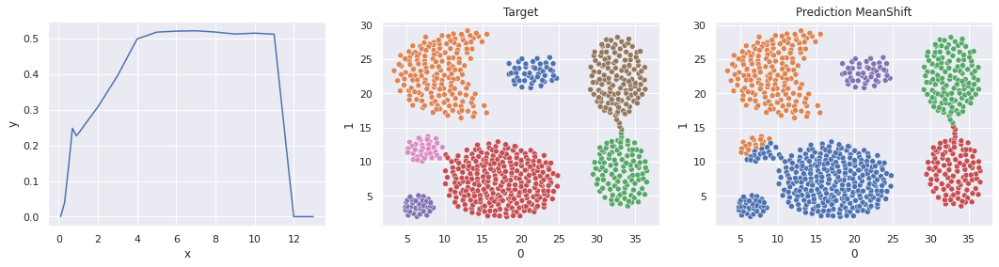

Best bandwidth = 7
[MeanShift]: accuracy 0.9415


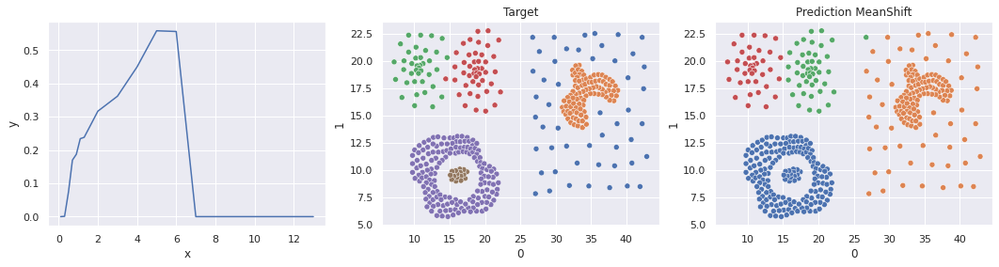

Best bandwidth = 5
[MeanShift]: accuracy 0.9092


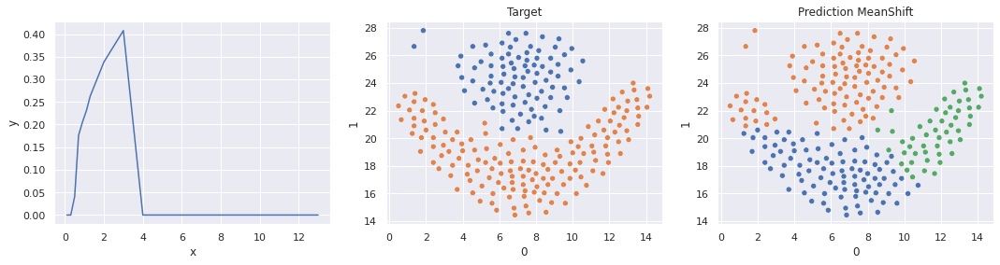

Best bandwidth = 3
[MeanShift]: accuracy 0.7155


In [29]:
BandWidth_range = list(np.arange(0.1, 1.4, 0.2)) + list(np.arange(2, 14, 1))

run_MeanShift_on_data(OTHER_FORMS_DATA, BandWidth_range, "OTHER_FORMS", path=ROOT_DATA)

### Real dataset (Iris)

In [30]:
import pandas as pd
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

iris = datasets.load_iris()
iris_labels = iris.target
data = pd.DataFrame(iris.data,columns = iris.feature_names)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [31]:
scaler = MinMaxScaler()
data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

data.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,0.222222,0.625000,0.067797,0.041667
1,0.166667,0.416667,0.067797,0.041667
2,0.111111,0.500000,0.050847,0.041667
3,0.083333,0.458333,0.084746,0.041667
4,0.194444,0.666667,0.067797,0.041667


In [32]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(data)
PCA_iris_data = pd.DataFrame(data = principalComponents , columns = ['pc1', 'pc2','pc3'])

PCA_iris_data.head()

,pc1,pc2,pc3
0,-0.630703,0.107578,-0.018719
1,-0.622905,-0.104260,-0.049142
2,-0.669520,-0.051417,0.019644
3,-0.654153,-0.102885,0.023219
4,-0.648788,0.133488,0.015116


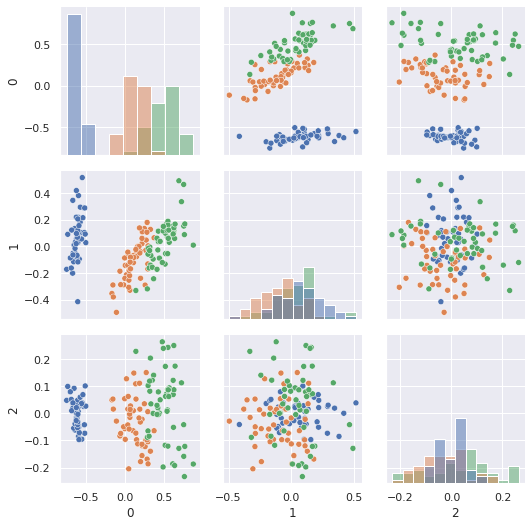

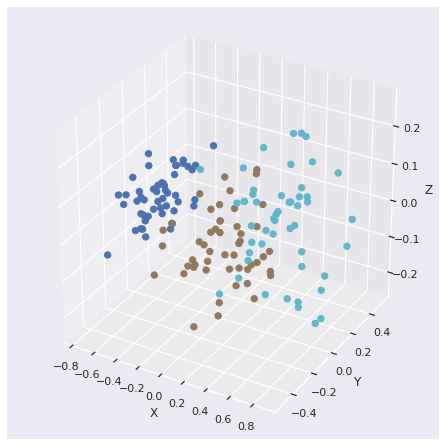

[MeanShift]: accuracy 0.3289, time 0.201, mem 0.223Mb


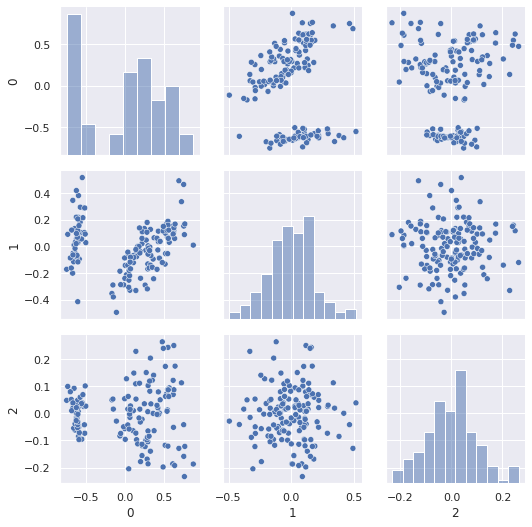

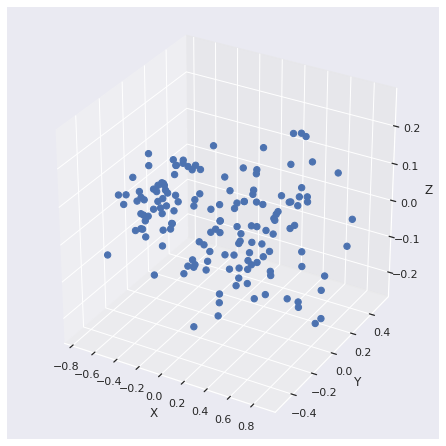

In [33]:
run_on_3d_data(PCA_iris_data.values, iris_labels, 3, data_name="Real_Data", path=ROOT_DATA)

## Time and Memory tests

In [34]:
from meanshift_utils import evaluation_time_of_working_by_k, evaluation_time_of_working_by_size, evaluation_mem_of_working_by_k, evaluation_mem_of_working_by_size

K_RANGE = [2, 3, 5, 8, 10, 15, 30]

100%|██████████| 7/7 [01:30<00:00, 12.88s/it]


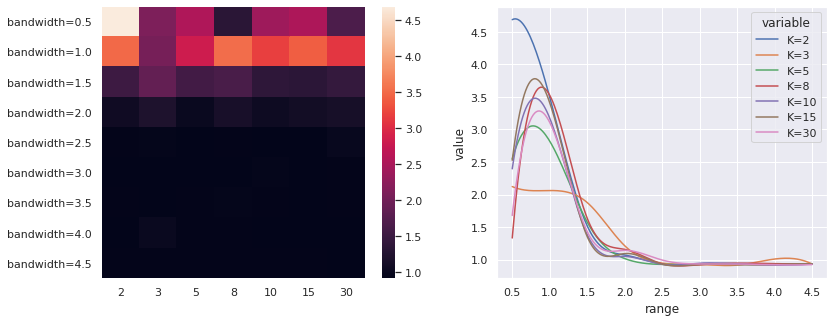

In [35]:
evaluation_time_of_working_by_k(K_RANGE, 
                                finding_bandwidth = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5],
                                total_size=1000, 
                                path=ROOT_DATA)

100%|██████████| 4/4 [00:25<00:00,  6.31s/it]


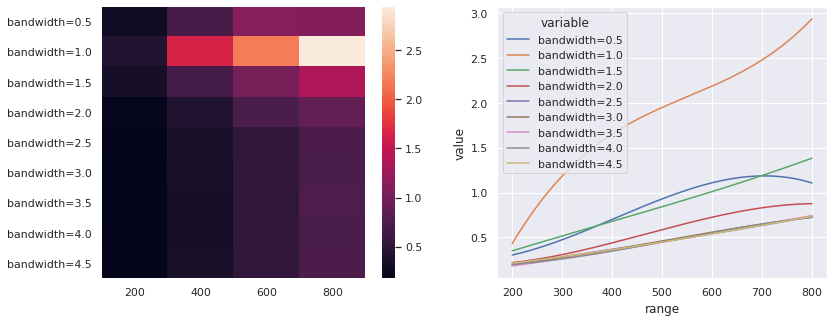

In [36]:
evaluation_time_of_working_by_size(7, 
                                   finding_bandwidth = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5],
                                   path=ROOT_DATA)

100%|██████████| 7/7 [02:07<00:00, 18.23s/it]


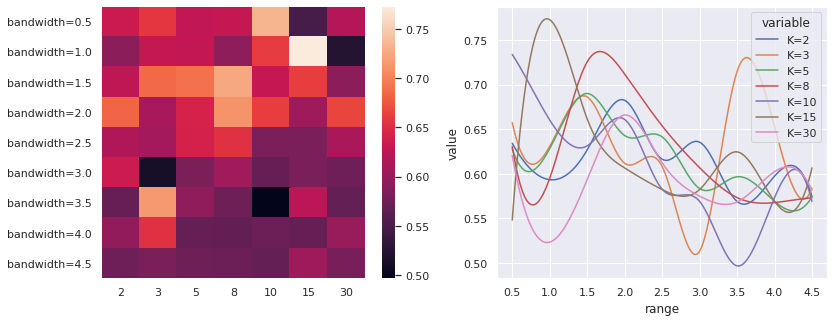

In [37]:
evaluation_mem_of_working_by_k(K_RANGE, 
                               finding_bandwidth = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5],
                               total_size=1000, 
                               path=ROOT_DATA)

100%|██████████| 4/4 [00:35<00:00,  8.93s/it]


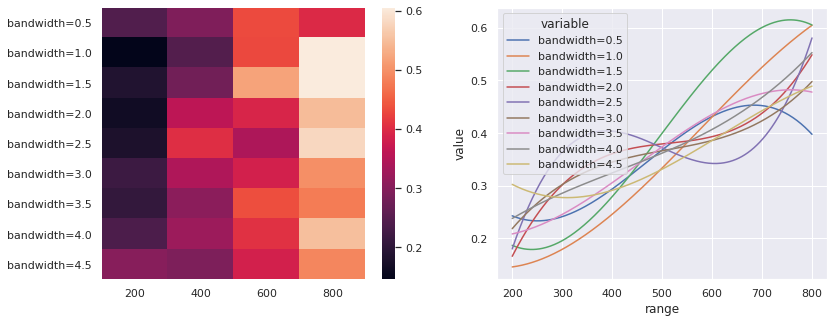

In [38]:
evaluation_mem_of_working_by_size(7, 
                                  finding_bandwidth = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5],
                                  path=ROOT_DATA)

## Check Stability and Initial dependency 

In [39]:
from meanshift_utils import check_init_dependency, check_stability

100%|██████████| 7/7 [01:05<00:00,  9.32s/it]


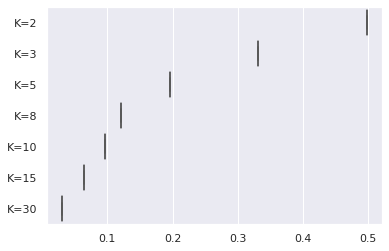

In [40]:
check_init_dependency(path=ROOT_DATA, iter=25, size=250)

100%|██████████| 6/6 [01:22<00:00, 13.70s/it]


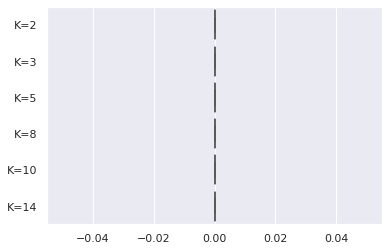

In [41]:
check_stability(path=ROOT_DATA, iter=25, cluster_size=30)